## Importing Libraries

In [1]:
import numpy as np
import pandas as pd
import cv2
import os
from xml.etree import ElementTree
from matplotlib import pyplot as plt

In [2]:
import tensorflow as tf
from sklearn.metrics import confusion_matrix
from tensorflow.keras import datasets, layers, models
keras = tf.keras

## Defining two classes - person and person-like and fixing the image size to be 200,200

In [3]:
class_names = ['person','person-like']
class_names_label = {class_name:i for i, class_name in enumerate(class_names)}

n_classes = 2
size = (200,200)

### Loading datasets from each split

In [4]:
def load_data():
    datasets = ['Train/Train', 'Test/Test', 'Val/Val']
    output = []

    for dataset in datasets:
        imags = []
        labels = []
        directoryA = "D:/pedes/" + dataset +"/Annotations"
        directoryIMG = "D:/pedes/" + dataset +"/JPEGImages/"
        file = os.listdir(directoryA)
        img = os.listdir(directoryIMG)
        file.sort()
        img.sort()

        i = 0
        for xml in file:

            xmlf = os.path.join(directoryA,xml)
            dom = ElementTree.parse(xmlf)
            vb = dom.findall('object')
            label = vb[0].find('name').text
            labels.append(class_names_label[label])

            img_path = directoryIMG + img[i]
            curr_img = cv2.imread(img_path)
            curr_img = cv2.resize(curr_img, size)
            imags.append(curr_img)
            i +=1
        
        imags = np.array(imags, dtype='float32')
        imags = imags / 255
        
        labels = np.array(labels, dtype='int32')

        output.append((imags, labels))
    return output

In [5]:
(train_images, train_labels),(test_images, test_labels),(val_images, val_labels) = load_data()

In [6]:
train_images.shape

(944, 200, 200, 3)

In [13]:
test_images.shape

(235, 200, 200, 3)

In [14]:
val_images.shape

(160, 200, 200, 3)

### Visualizing the images with their labels from the train split

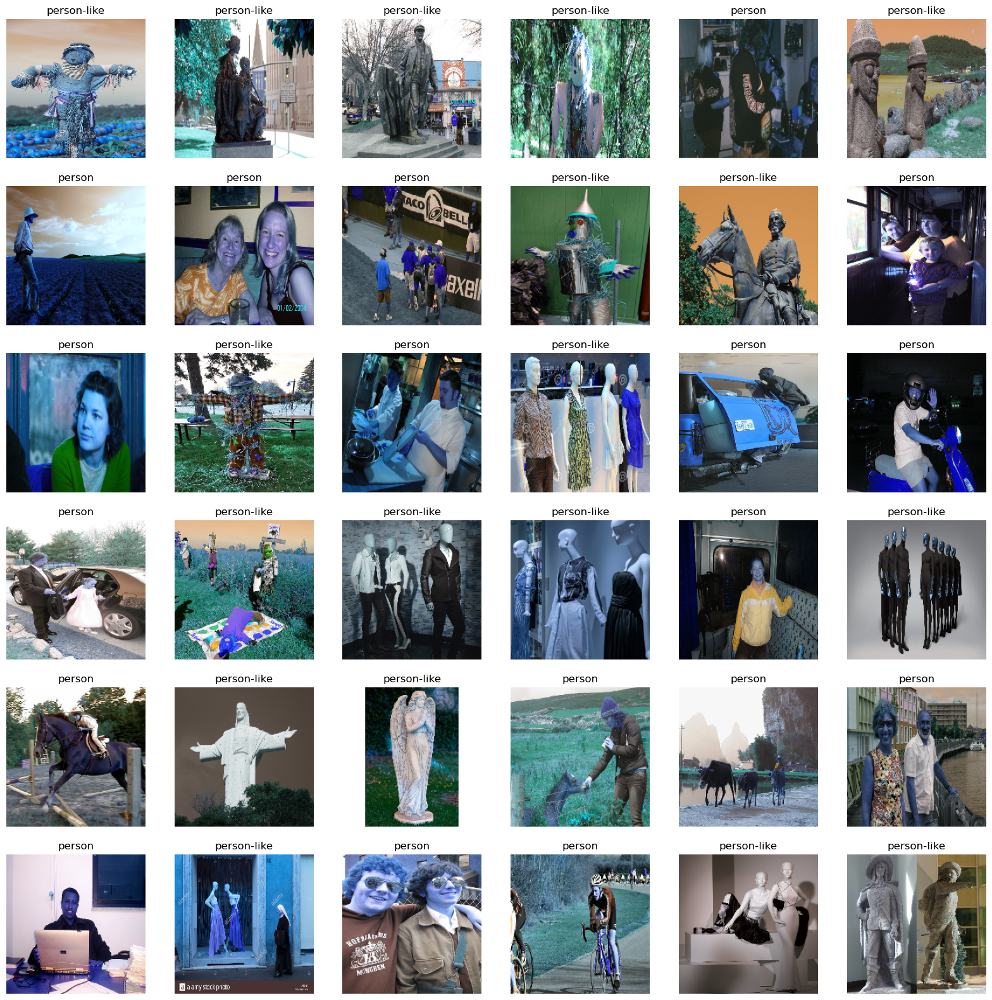

In [15]:
plt.figure(figsize=(20,20))
for n , i in enumerate(list(np.random.randint(0,len(train_images),36))) : 
    plt.subplot(6,6,n+1)
    plt.imshow(train_images[i])  
    plt.title(class_names[train_labels[i]])
    plt.axis('off')

## Model - CNN

In [16]:
model = models.Sequential()
model.add(layers.Conv2D(16, (3, 3), activation='relu', input_shape=(200, 200, 3)))
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.Conv2D(32, (3, 3), activation='relu'))
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.Conv2D(64, (3, 3), activation='relu'))

In [17]:
model.add(layers.Flatten())
model.add(layers.Dense(128, activation='relu'))
model.add(layers.Dense(2))

In [18]:
model.compile(optimizer='adam',
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])

In [19]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 198, 198, 16)      448       
                                                                 
 max_pooling2d (MaxPooling2D  (None, 99, 99, 16)       0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 97, 97, 32)        4640      
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 48, 48, 32)       0         
 2D)                                                             
                                                                 
 conv2d_2 (Conv2D)           (None, 46, 46, 64)        18496     
                                                                 
 flatten (Flatten)           (None, 135424)            0

### Training for 20 epochs

In [20]:
history = model.fit(train_images, train_labels, epochs=20, 
                    validation_data=(test_images, test_labels))

Epoch 1/20
30/30 [==============================] - 10s 297ms/step - loss: 1.0242 - accuracy: 0.5572 - val_loss: 0.6720 - val_accuracy: 0.6043
Epoch 2/20
30/30 [==============================] - 9s 286ms/step - loss: 0.6230 - accuracy: 0.6610 - val_loss: 0.6318 - val_accuracy: 0.6596
Epoch 3/20
30/30 [==============================] - 12s 410ms/step - loss: 0.5238 - accuracy: 0.7426 - val_loss: 0.6505 - val_accuracy: 0.6128
Epoch 4/20
30/30 [==============================] - 11s 358ms/step - loss: 0.3558 - accuracy: 0.8390 - val_loss: 0.6509 - val_accuracy: 0.6681
Epoch 5/20
30/30 [==============================] - 11s 363ms/step - loss: 0.1816 - accuracy: 0.9333 - val_loss: 0.7287 - val_accuracy: 0.6809
Epoch 6/20
30/30 [==============================] - 11s 367ms/step - loss: 0.0997 - accuracy: 0.9650 - val_loss: 1.0154 - val_accuracy: 0.6638
Epoch 7/20
30/30 [==============================] - 11s 367ms/step - loss: 0.0585 - accuracy: 0.9862 - val_loss: 1.2605 - val_accuracy: 0.6553


## Visualizing the training accuracy and loss

In [25]:
def plot_accuracy_loss(history):
    """
        Plot the accuracy and the loss during the training of the nn.
    """
    fig = plt.figure(figsize=(10,5))

    # Plot accuracy
    plt.subplot(221)
    plt.plot(history.history['accuracy'],'bo--', label = "acc")
    plt.plot(history.history['val_accuracy'], 'ro--', label = "val_acc")
    plt.title("train_acc vs val_acc")
    plt.ylabel("accuracy")
    plt.xlabel("epochs")
    plt.legend()

    # Plot loss function
    plt.subplot(222)
    plt.plot(history.history['loss'],'bo--', label = "loss")
    plt.plot(history.history['val_loss'], 'ro--', label = "val_loss")
    plt.title("train_loss vs val_loss")
    plt.ylabel("loss")
    plt.xlabel("epochs")

    plt.legend()
    plt.show()

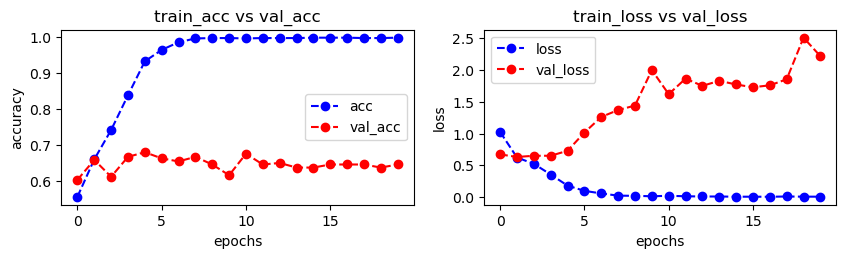

In [26]:
plot_accuracy_loss(history)

# Testing on Validation Data

In [27]:
val_labels

array([0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1])

## Making predictions

In [28]:
preds = model.predict(val_images)

5/5 [==============================] - 1s 85ms/step


In [146]:
# preds

In [142]:
# os.makedirs('D:/pedes/working/model')

In [143]:
# model.save('D:/pedes/working/model')

### Loading the images from validation set along with their predicted label

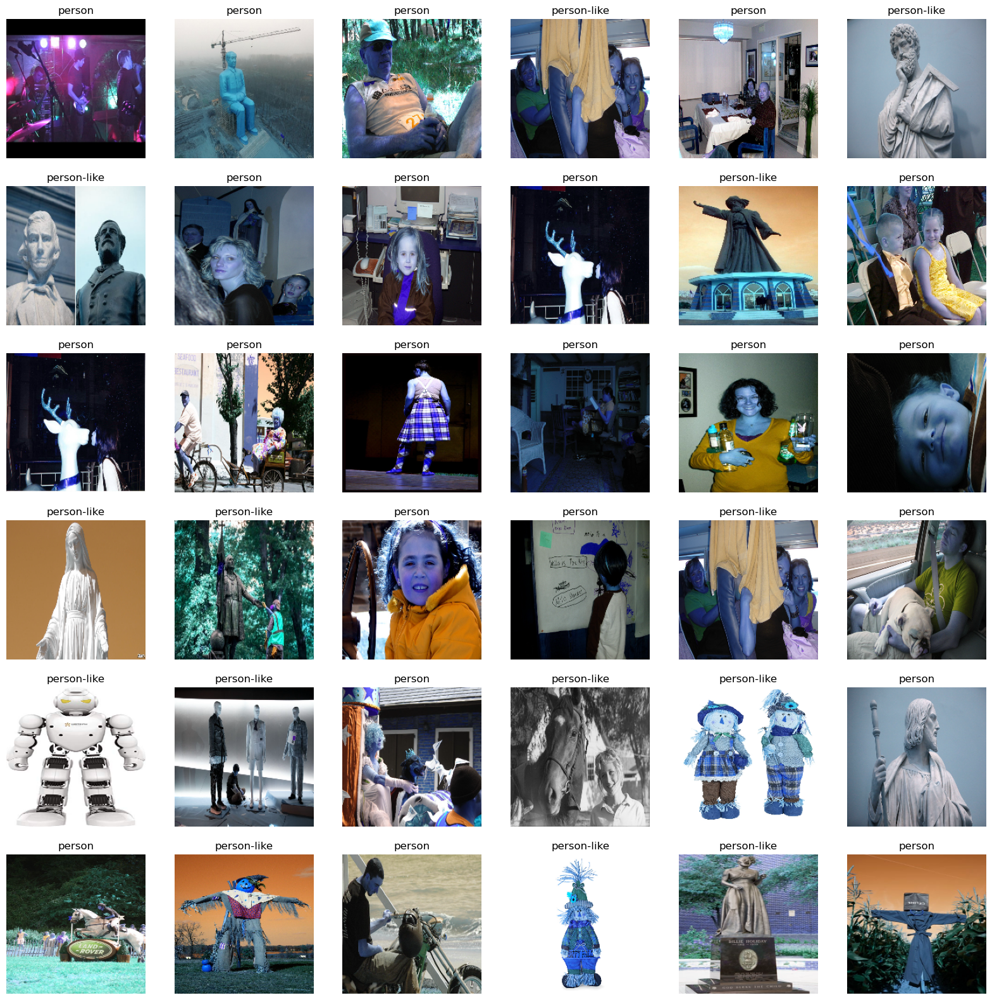

In [67]:
plt.figure(figsize=(20,20))
for n , i in enumerate(list(np.random.randint(0,len(val_images), 36))) : 
    plt.subplot(6,6,n+1)
    plt.imshow(val_images[i])    
    plt.axis('off')
    x =np.argmax(preds[i]) # takes the maximum of of the 6 probabilites. 
    plt.title((class_names[x]))

### Storing the prediction results in a list

In [73]:
result = []
for i in range(len(preds)):
    result.append(np.argmax(preds[i]))

### Finding the true negatives, false postives, false negatives and true positives for the results

In [74]:
tn, fp, fn, tp = confusion_matrix(val_labels,result).ravel()

In [75]:
(tn, fp, fn, tp)

(75, 10, 33, 42)

### Function to calculate the accuracu, precision, recall and f1-score and the score report

In [98]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, classification_report

def calculate_metrices(y_true, y_preds):
    
    accuracy = accuracy_score(y_true, y_preds)
    precision = precision_score(y_true, y_preds)
    recall = recall_score(y_true, y_preds)
    f1 = f1_score(y_true, y_preds)

    
    report = classification_report(y_true, y_preds)

    
    df = pd.DataFrame({
        'Metric': ['Accuracy', 'Precision', 'Recall', 'F1 Score'],
        'Score': [accuracy, precision, recall, f1]
    })

    return (report, df)

In [99]:
report, val_df = calculate_metrices(val_labels, result)

In [101]:
print(report)

              precision    recall  f1-score   support

           0       0.69      0.88      0.78        85
           1       0.81      0.56      0.66        75

    accuracy                           0.73       160
   macro avg       0.75      0.72      0.72       160
weighted avg       0.75      0.73      0.72       160



In [102]:
val_df

,Metric,Score
0,Accuracy,0.731250
1,Precision,0.807692
2,Recall,0.560000
3,F1 Score,0.661417


### Function to plot the metrices

In [103]:
def plot_met(df):
    plt.bar(df['Metric'], df['Score'])
    plt.ylim([0, 1])
    plt.title('Classification Results')
    plt.ylabel('Score')
    plt.show()

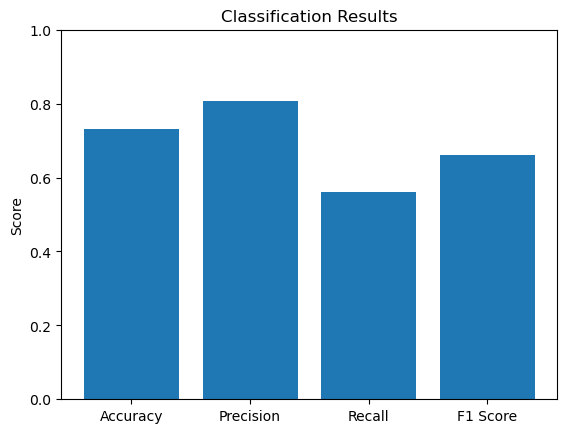

In [104]:
plot_met(val_df)

### Function to plot the confusion matrix

In [105]:
from sklearn.metrics import confusion_matrix
import seaborn as sns

def cmh(y_true, y_preds):
    cm = confusion_matrix(y_true, y_preds)

    sns.heatmap(cm, annot=True, cmap='Blues', fmt='g')
    plt.title('Confusion Matrix')
    plt.xlabel('Predicted')
    plt.ylabel('True')
    plt.show()

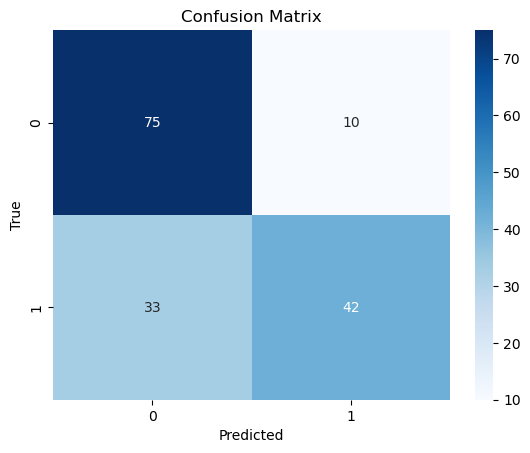

In [106]:
cmh(val_labels, result)

# Testing on Test Data

In [107]:
test_preds = model.predict(test_images)

8/8 [==============================] - 1s 80ms/step


In [145]:
# test_preds

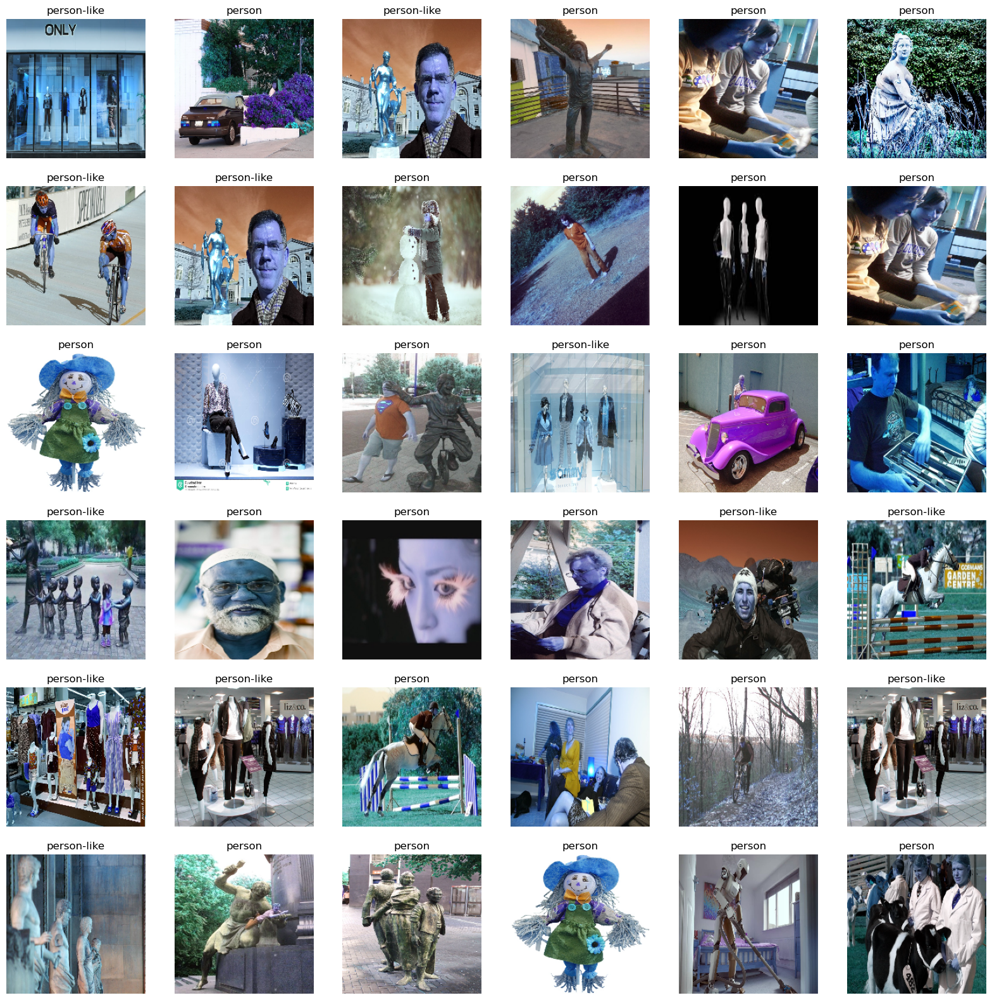

In [120]:
plt.figure(figsize=(20,20))
for n , i in enumerate(list(np.random.randint(0,len(test_images), 36))) : 
    plt.subplot(6,6,n+1)
    plt.imshow(test_images[i])    
    plt.axis('off')
    x =np.argmax(test_preds[i]) # takes the maximum of of the 6 probabilites. 
    plt.title((class_names[x]))

In [113]:
len(test_images)

235

In [126]:
test_result = []
for i in range(len(test_preds)):
    test_result.append(np.argmax(test_preds[i]))

In [144]:
# test_result, test_labels

In [131]:
tn, fp, fn, tp = confusion_matrix(test_labels,test_result).ravel()

In [132]:
tn, fp, fn, tp

(114, 22, 61, 38)

In [133]:
test_report, test_df = calculate_metrices(test_labels, test_result)

In [135]:
print(test_report)

              precision    recall  f1-score   support

           0       0.65      0.84      0.73       136
           1       0.63      0.38      0.48        99

    accuracy                           0.65       235
   macro avg       0.64      0.61      0.61       235
weighted avg       0.64      0.65      0.63       235



In [136]:
test_df

,Metric,Score
0,Accuracy,0.646809
1,Precision,0.633333
2,Recall,0.383838
3,F1 Score,0.477987


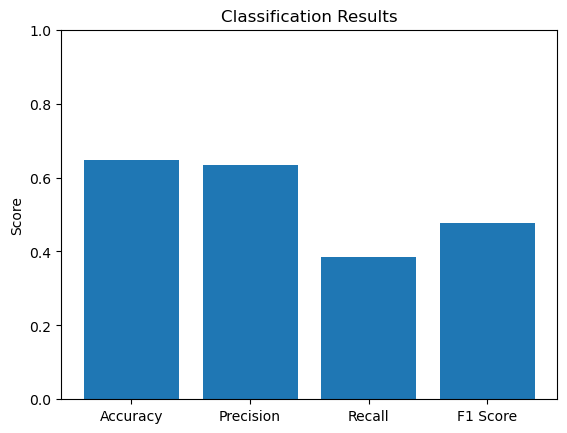

In [137]:
plot_met(test_df)

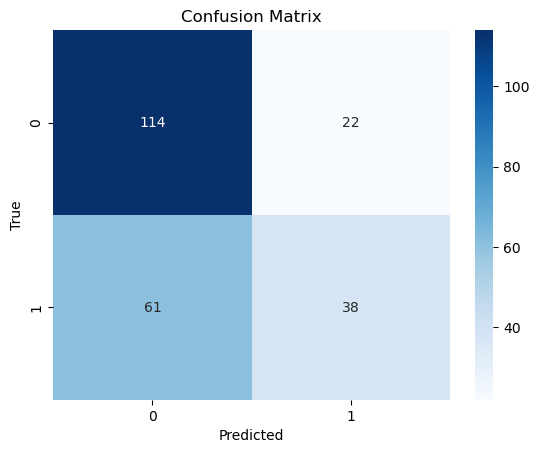

In [138]:
cmh(test_labels, test_result)